In [1]:
import warnings
warnings.filterwarnings(action='ignore')

import pandas as pd 
import numpy as np
pd.set_option("max_rows", 500)
pd.set_option("max_columns", 500)
pd.set_option('float_format', '{:f}'.format)

import dataload

import os 
import datetime
from tqdm import tqdm 
from functools import reduce

In [68]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt 

plt.style.use('seaborn')
plt.rc('font', family='AppleGothic')
plt.rc('axes', unicode_minus=False)

In [39]:
weather1 = pd.read_csv('weather1819.csv', encoding='cp949')
weather2 = pd.read_csv('weather1819_2.csv', encoding='cp949')

In [38]:
buy_full = dataload.load_buy()
print(buy_full.shape)
buy_full.head()

(2056899, 6)


,date,sex,age,big_cat,sm_cat,qty
0,20180101,F,20,식품,가공란,37
1,20180101,F,30,식품,가공란,16
2,20180101,F,40,식품,가공란,9
3,20180101,F,50,식품,가공란,3
4,20180101,M,20,식품,가공란,13


In [40]:
print(weather1.shape)
weather1.head()

(11680, 8)


,date,stn_id,avg_ta,max_ta,min_ta,rn_day,rn_hr1,avg_ws
0,2018-01-01,105,1.300000,5.700000,-2.100000,0.000000,0.000000,3.700000
1,2018-01-01,112,-0.300000,2.700000,-2.700000,0.000000,0.000000,1.600000
2,2018-01-01,119,-1.700000,4.700000,-6.900000,0.000000,0.000000,1.000000
3,2018-01-01,136,-1.000000,4.700000,-6.500000,0.000000,0.000000,2.200000
4,2018-01-01,152,2.100000,6.200000,-0.400000,0.000000,0.000000,3.300000


In [42]:
tqdm.pandas()
buy_full["date"] = buy_full["date"].progress_apply(lambda x : pd.to_datetime(str(x), format='%Y-%m-%d'))
weather1["date"] = weather1["date"].progress_apply(lambda x : pd.to_datetime(x))

100%|██████████| 11680/11680 [00:00<00:00, 16264.94it/s]


# 1. 전체 데이터 

In [45]:
buy_full = buy_full.groupby('date').sum('qty').reset_index()[["date","qty"]]

In [64]:
def weather_correlation(loc) : 
    df = weather1[weather1.stn_id == loc].reset_index(drop=True)
    df = df.merge(buy_full, on="date")
    co = dict(df.corr()["qty"])
    return co

In [65]:
weathercorrelation = dict()
for loc in weather1.stn_id.unique() :
    weathercorrelation[loc] = weather_correlation(loc)

In [66]:
pd.DataFrame(weathercorrelation)

,105,112,119,136,152,184,232,131,143,155,168,159,108,156,146,133
stn_id,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
avg_ta,-0.062027,-0.092222,-0.088584,-0.086009,-0.077512,-0.103162,-0.092971,-0.078935,-0.070654,-0.088470,-0.096058,-0.090088,-0.084114,-0.102995,-0.096505,-0.083602
max_ta,-0.045480,-0.090209,-0.083933,-0.082740,-0.062806,-0.097950,-0.087128,-0.078124,-0.061113,-0.072197,-0.088232,-0.086085,-0.078987,-0.100724,-0.090646,-0.079321
min_ta,-0.074380,-0.092959,-0.098278,-0.103938,-0.093542,-0.100599,-0.107603,-0.088323,-0.088650,-0.100380,-0.099802,-0.091344,-0.094323,-0.104170,-0.102384,-0.094647
rn_day,-0.006571,-0.009641,-0.008392,-0.006930,-0.034567,-0.001673,-0.034813,-0.019832,-0.054103,-0.032426,-0.032398,-0.055707,-0.010118,-0.061873,-0.044653,-0.037757
rn_hr1,0.004687,0.006013,0.007599,0.021034,-0.024930,0.032421,0.004224,0.009246,-0.042578,-0.024996,-0.024364,-0.051824,-0.000521,-0.058702,-0.024314,-0.004890
avg_ws,0.062291,0.033294,-0.011490,0.000305,-0.050481,0.003261,-0.067013,-0.113290,-0.012365,-0.068388,0.011251,0.003819,0.113415,-0.020512,0.017191,-0.056338
qty,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [93]:
def weather_qty_graph(loc) : 
    df = weather1[weather1.stn_id == loc].reset_index(drop=True)
    df = df.merge(buy_full, on="date")    

    for i, weather in enumerate(['avg_ta', 'max_ta', 'min_ta', 'rn_day', 'rn_hr1', 'avg_ws']) : 
        plt.figure(i)
        plt.figure(figsize=(15,3))
        
        sns.lineplot(x='date', y='qty', data=df)
        ax2 = plt.twinx()
        sns.lineplot(x='date', y=weather, data=df, ax=ax2, color='g')
        plt.show()

<Figure size 576x396 with 0 Axes>

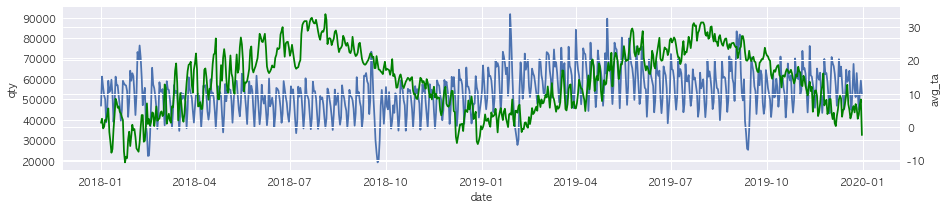

<Figure size 576x396 with 0 Axes>

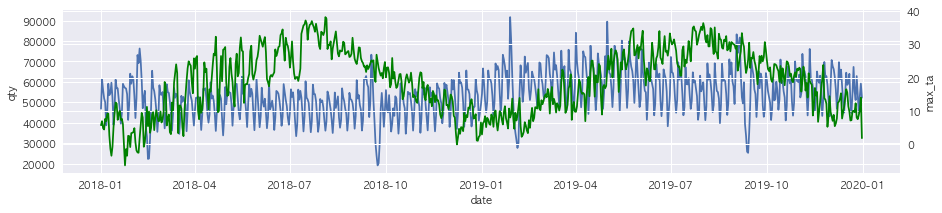

<Figure size 576x396 with 0 Axes>

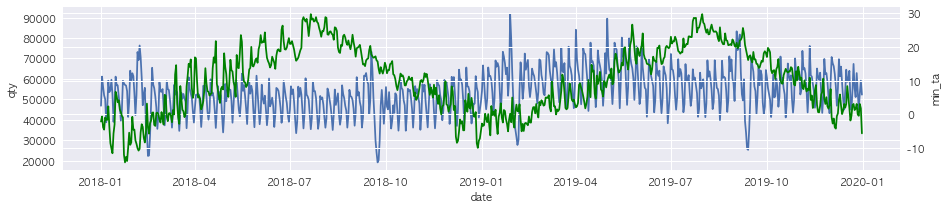

<Figure size 576x396 with 0 Axes>

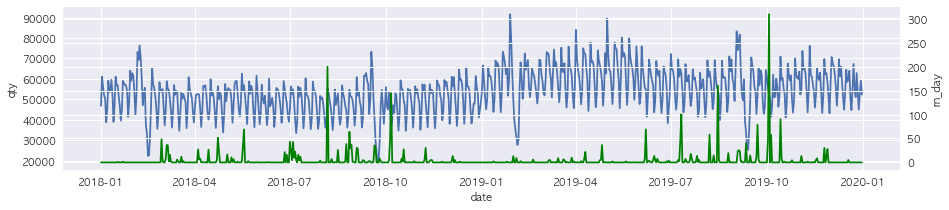

<Figure size 576x396 with 0 Axes>

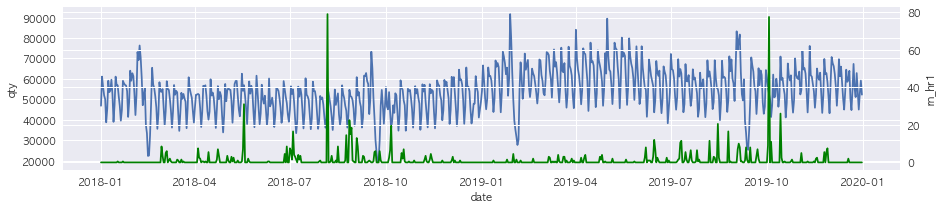

<Figure size 576x396 with 0 Axes>

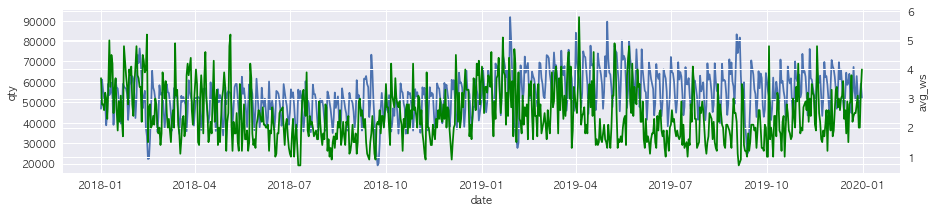

In [94]:
# 105
weather_qty_graph(105)

<Figure size 576x396 with 0 Axes>

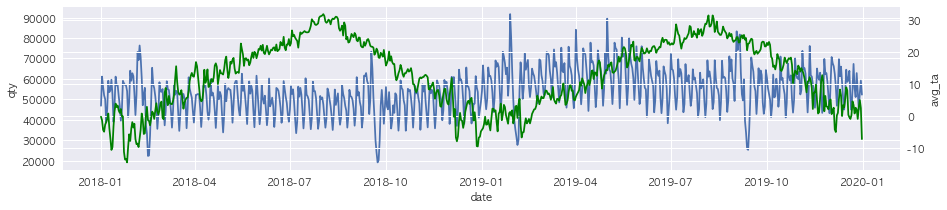

<Figure size 576x396 with 0 Axes>

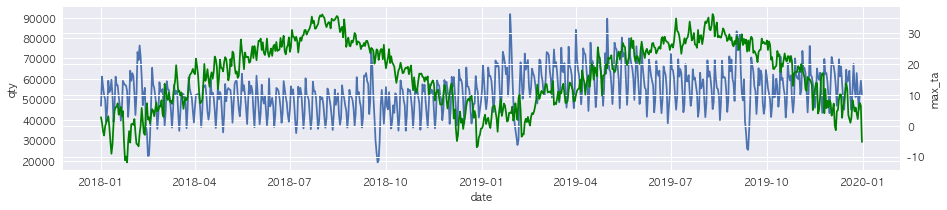

<Figure size 576x396 with 0 Axes>

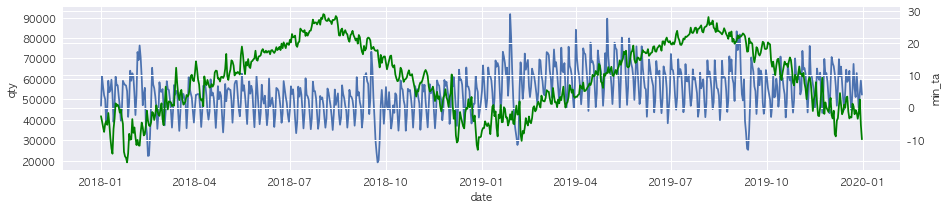

<Figure size 576x396 with 0 Axes>

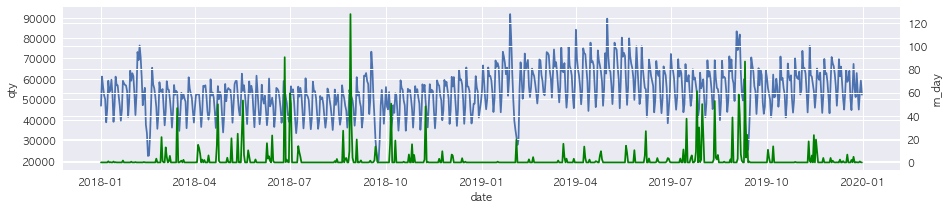

<Figure size 576x396 with 0 Axes>

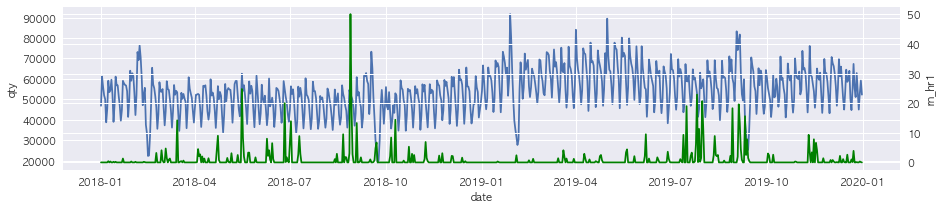

<Figure size 576x396 with 0 Axes>

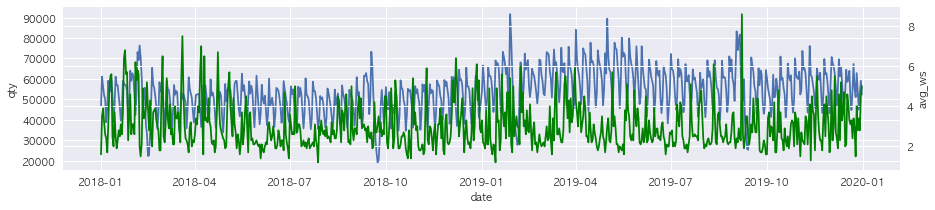

In [95]:
# 112
weather_qty_graph(112)

<Figure size 576x396 with 0 Axes>

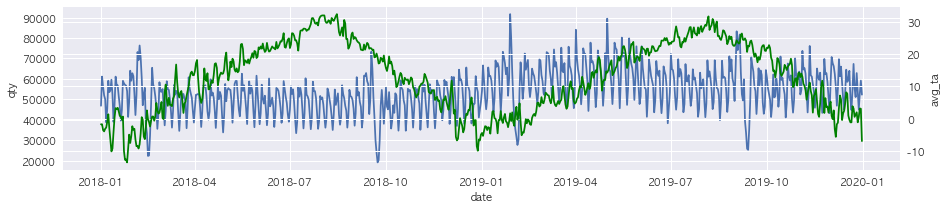

<Figure size 576x396 with 0 Axes>

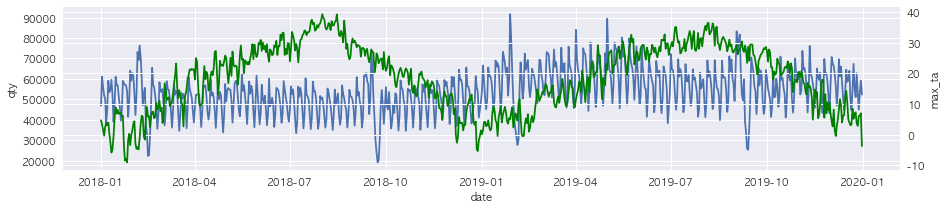

<Figure size 576x396 with 0 Axes>

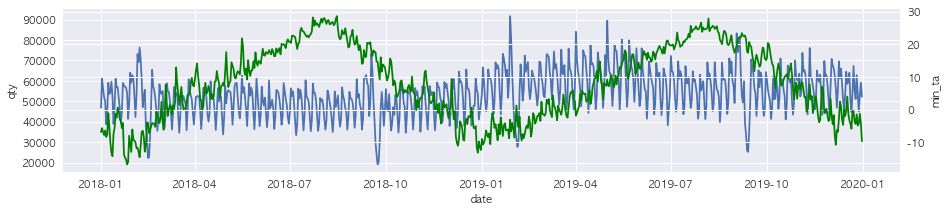

<Figure size 576x396 with 0 Axes>

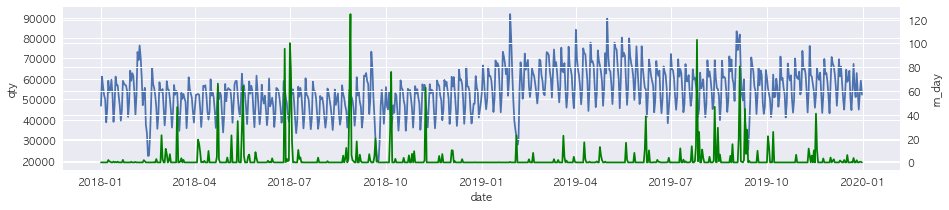

<Figure size 576x396 with 0 Axes>

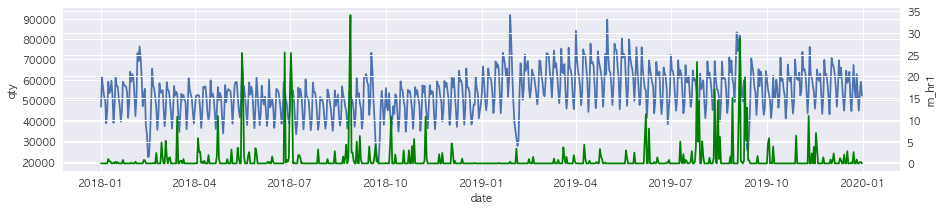

<Figure size 576x396 with 0 Axes>

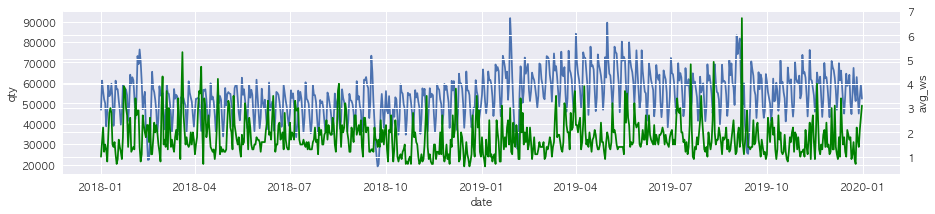

In [96]:
# 119
weather_qty_graph(119)

<Figure size 576x396 with 0 Axes>

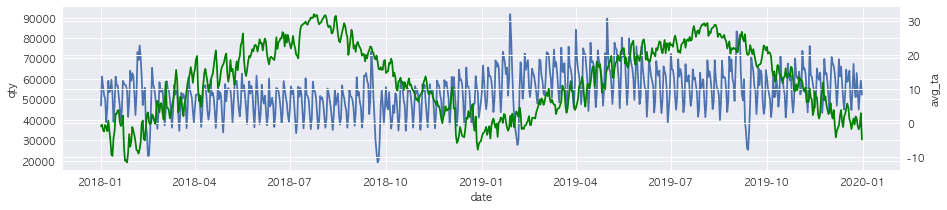

<Figure size 576x396 with 0 Axes>

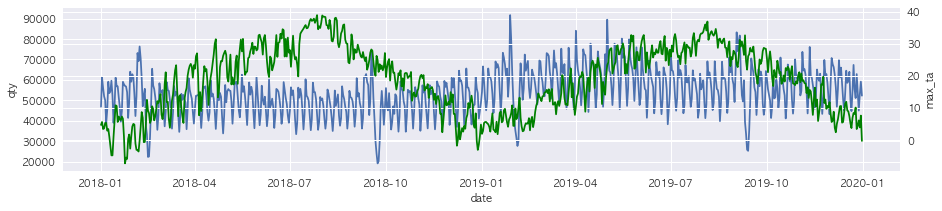

<Figure size 576x396 with 0 Axes>

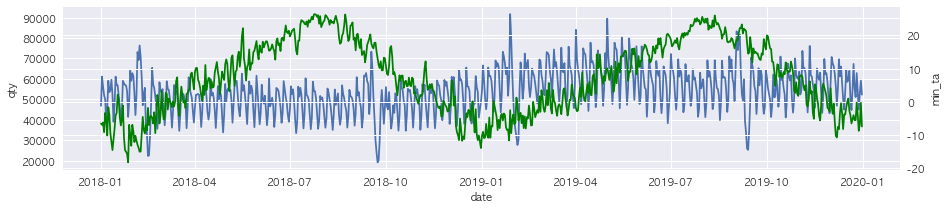

<Figure size 576x396 with 0 Axes>

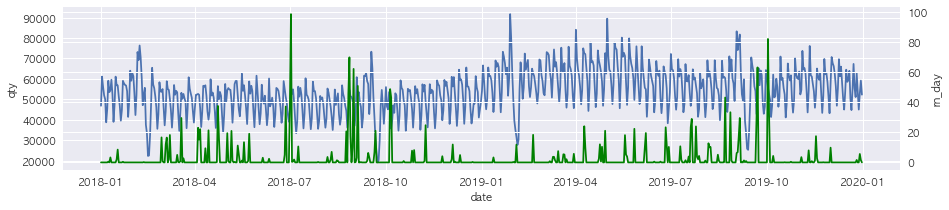

<Figure size 576x396 with 0 Axes>

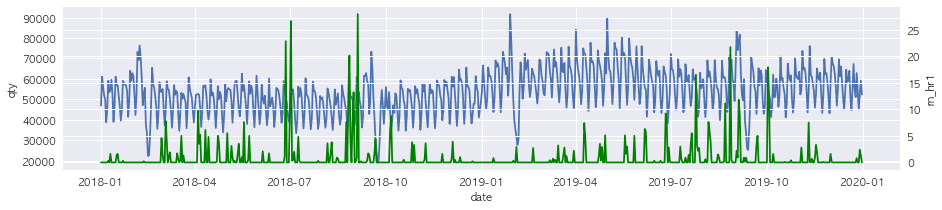

<Figure size 576x396 with 0 Axes>

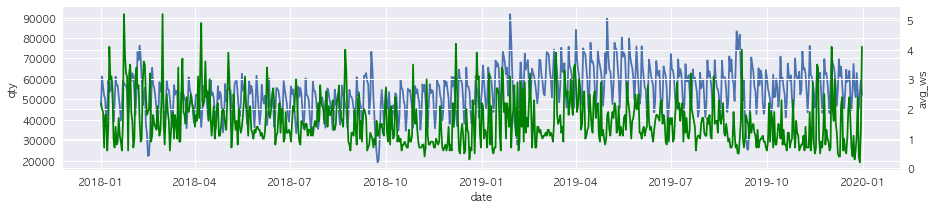

In [97]:
# 136
weather_qty_graph(136)

<Figure size 576x396 with 0 Axes>

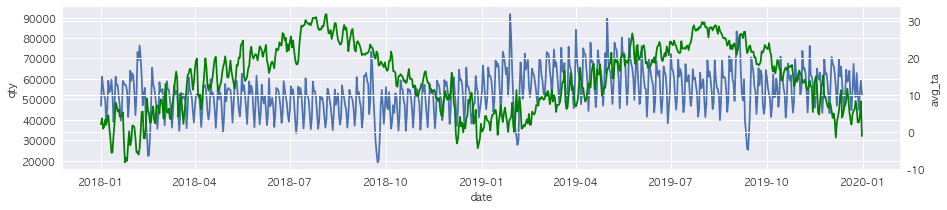

<Figure size 576x396 with 0 Axes>

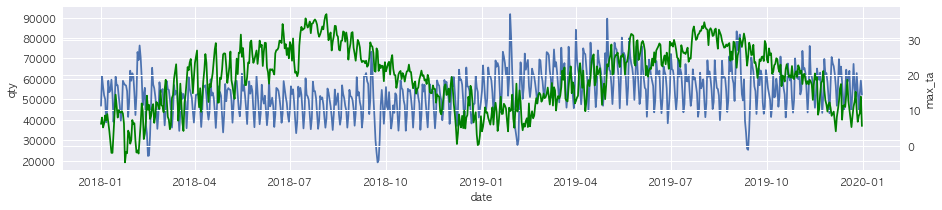

<Figure size 576x396 with 0 Axes>

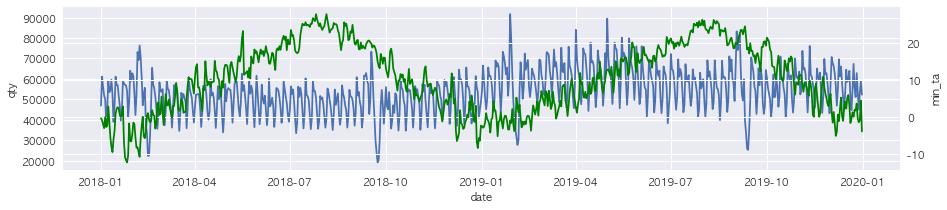

<Figure size 576x396 with 0 Axes>

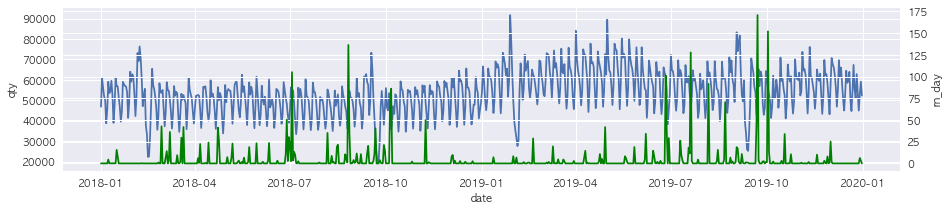

<Figure size 576x396 with 0 Axes>

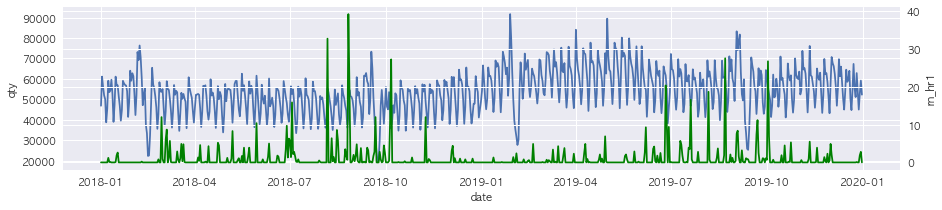

<Figure size 576x396 with 0 Axes>

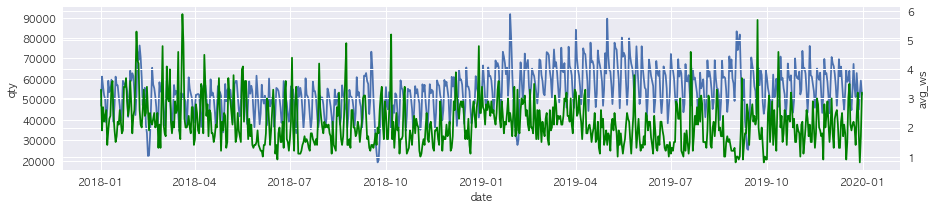

In [99]:
# 152
weather_qty_graph(152)

<Figure size 576x396 with 0 Axes>

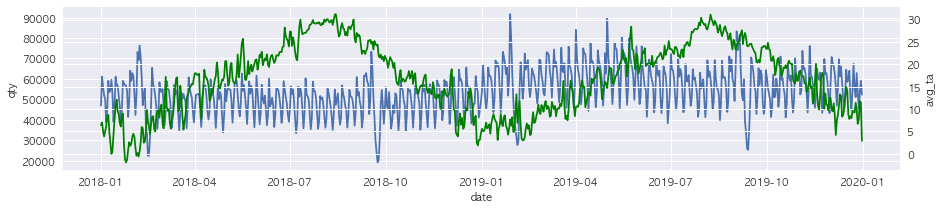

<Figure size 576x396 with 0 Axes>

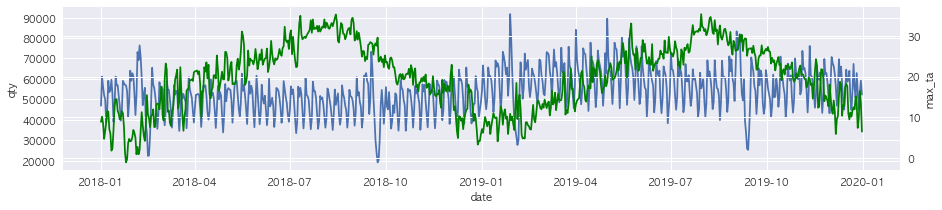

<Figure size 576x396 with 0 Axes>

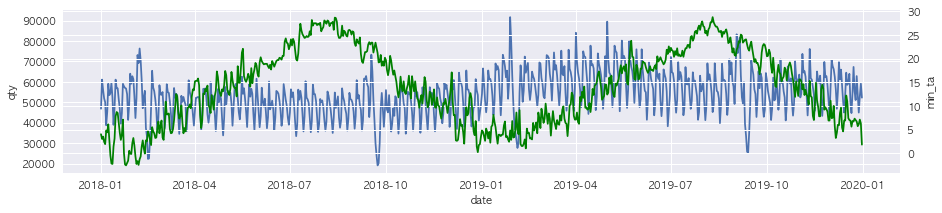

<Figure size 576x396 with 0 Axes>

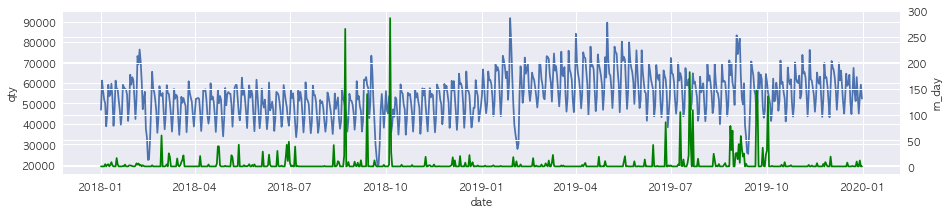

<Figure size 576x396 with 0 Axes>

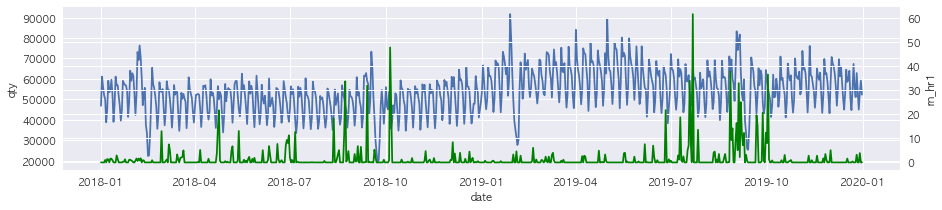

<Figure size 576x396 with 0 Axes>

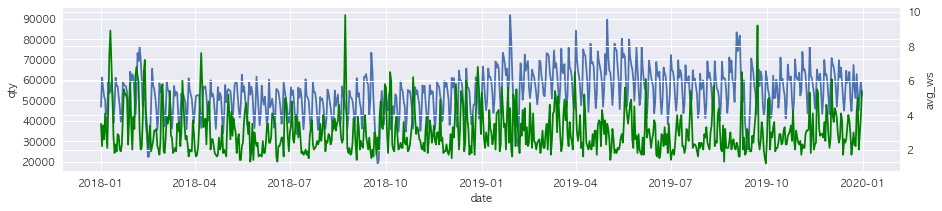

In [100]:
# 184
weather_qty_graph(184)

<Figure size 576x396 with 0 Axes>

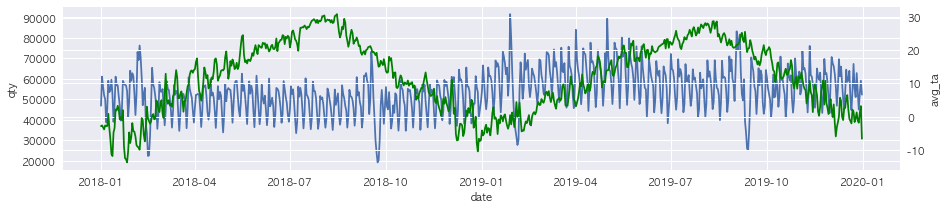

<Figure size 576x396 with 0 Axes>

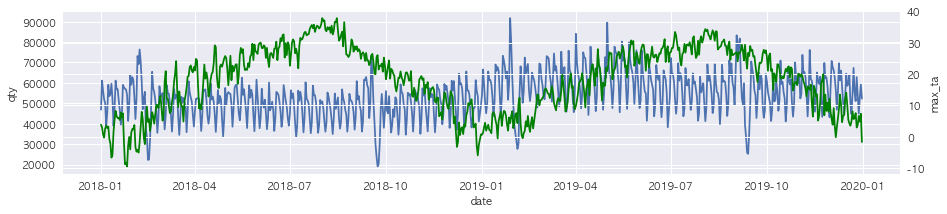

<Figure size 576x396 with 0 Axes>

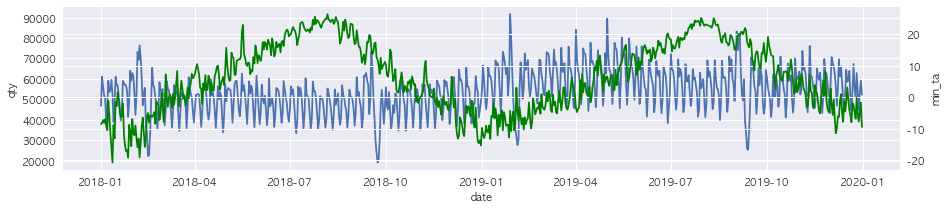

<Figure size 576x396 with 0 Axes>

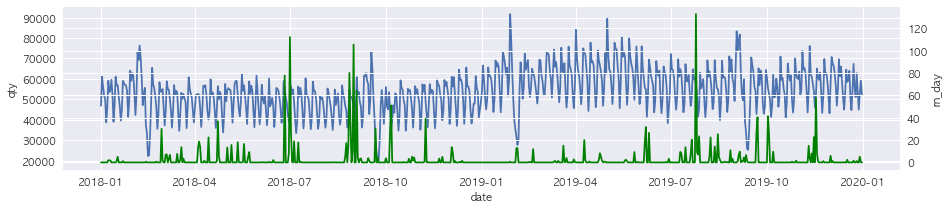

<Figure size 576x396 with 0 Axes>

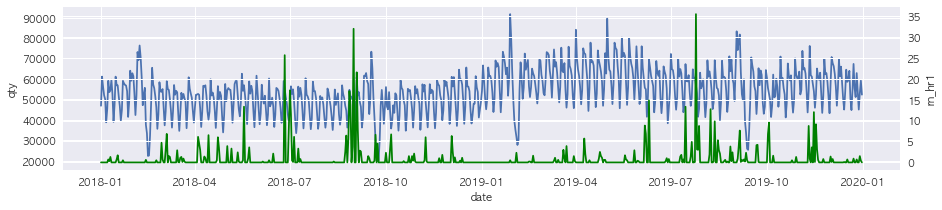

<Figure size 576x396 with 0 Axes>

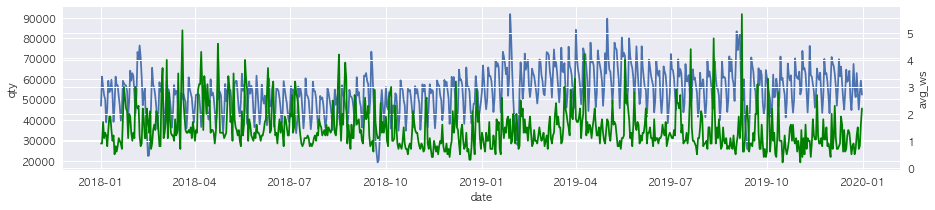

In [101]:
# 232
weather_qty_graph(232)

<Figure size 576x396 with 0 Axes>

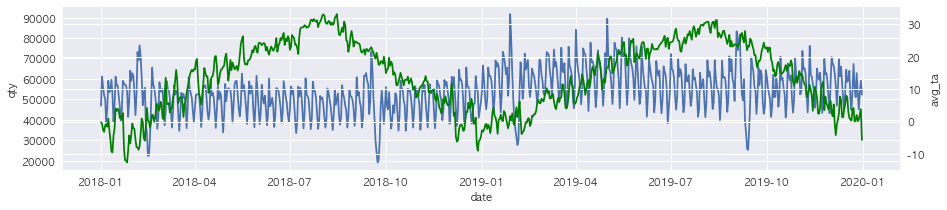

<Figure size 576x396 with 0 Axes>

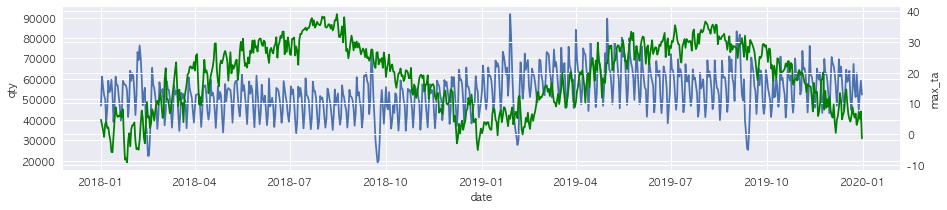

<Figure size 576x396 with 0 Axes>

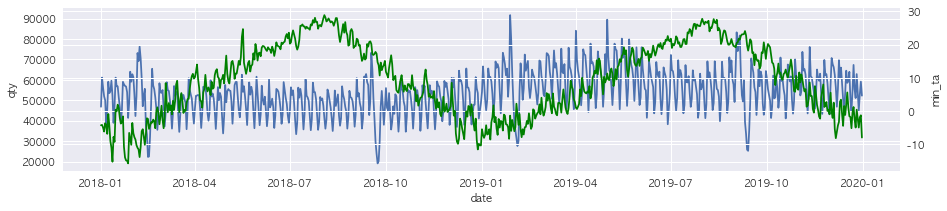

<Figure size 576x396 with 0 Axes>

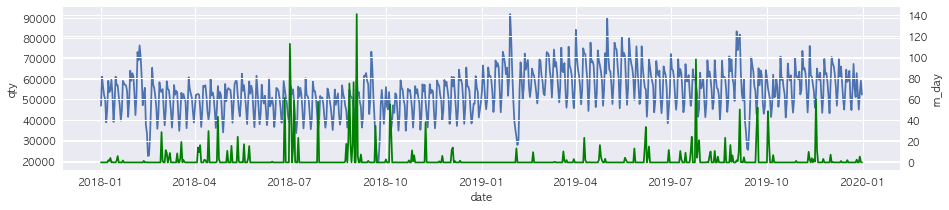

<Figure size 576x396 with 0 Axes>

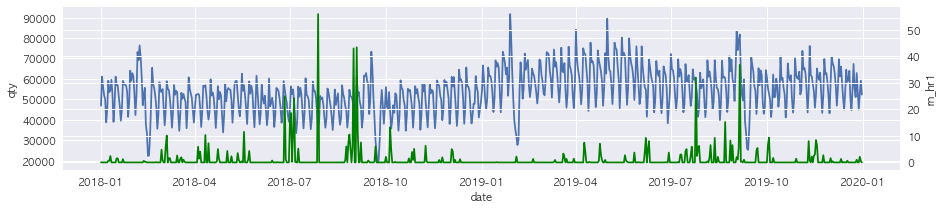

<Figure size 576x396 with 0 Axes>

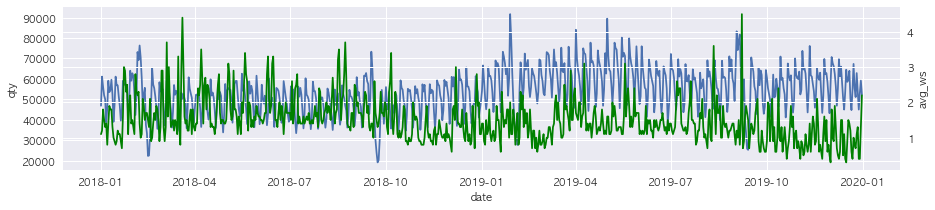

In [102]:
# 131
weather_qty_graph(131)

<Figure size 576x396 with 0 Axes>

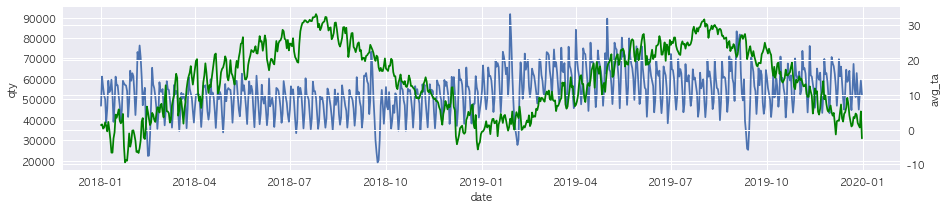

<Figure size 576x396 with 0 Axes>

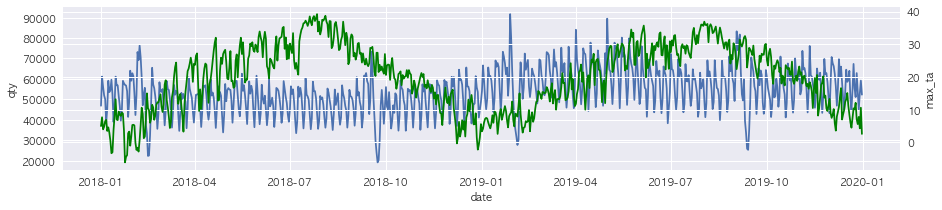

<Figure size 576x396 with 0 Axes>

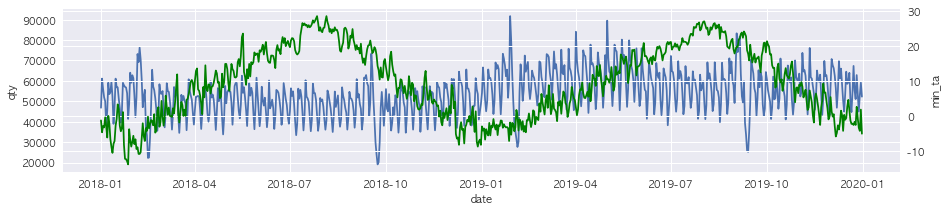

<Figure size 576x396 with 0 Axes>

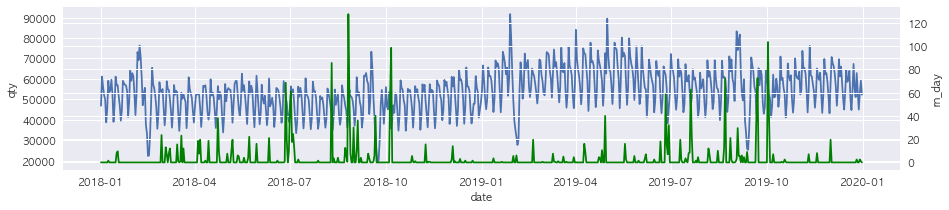

<Figure size 576x396 with 0 Axes>

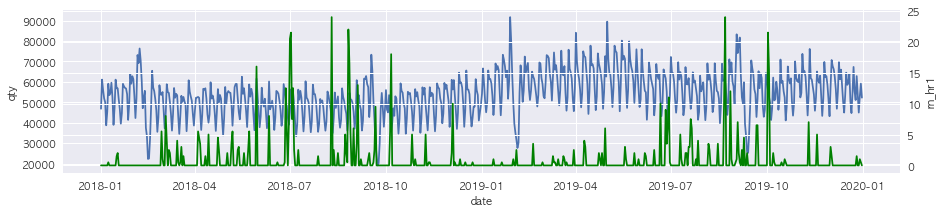

<Figure size 576x396 with 0 Axes>

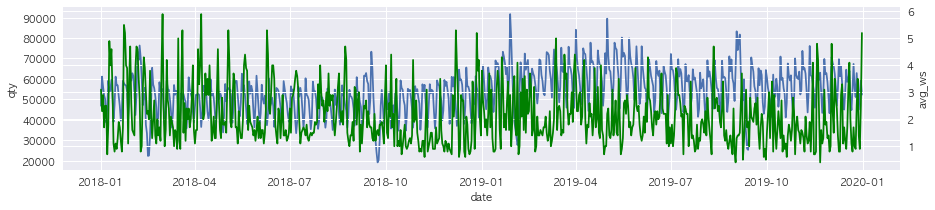

In [103]:
# 143
weather_qty_graph(143)

<Figure size 576x396 with 0 Axes>

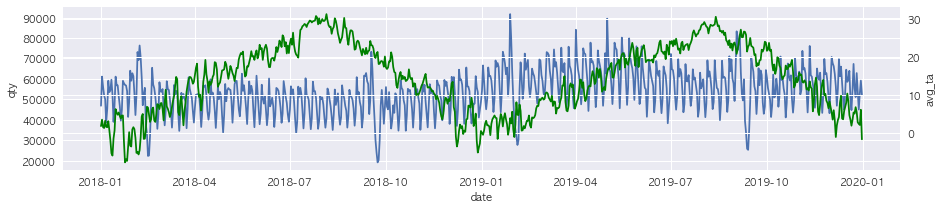

<Figure size 576x396 with 0 Axes>

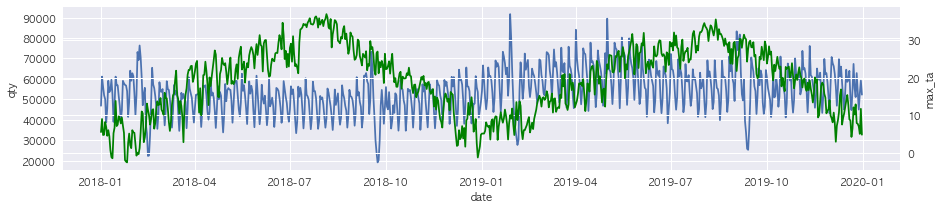

<Figure size 576x396 with 0 Axes>

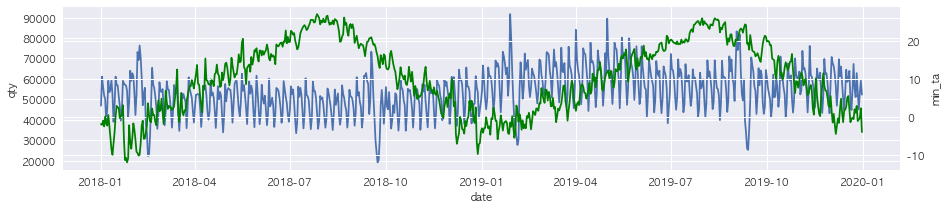

<Figure size 576x396 with 0 Axes>

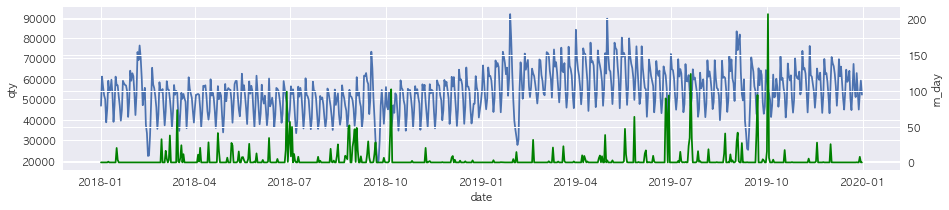

<Figure size 576x396 with 0 Axes>

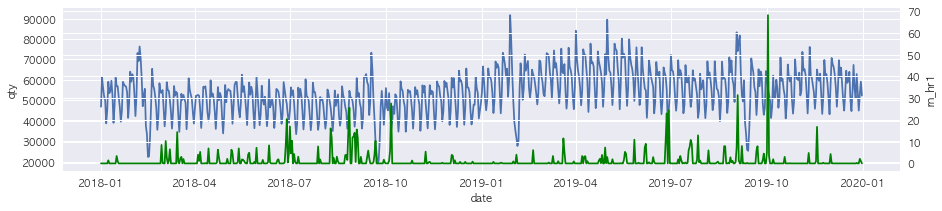

<Figure size 576x396 with 0 Axes>

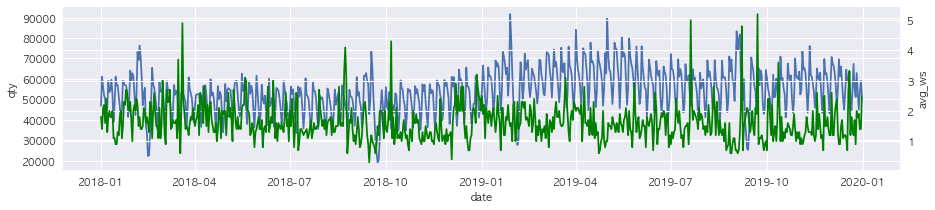

In [105]:
# 155
weather_qty_graph(155)

<Figure size 576x396 with 0 Axes>

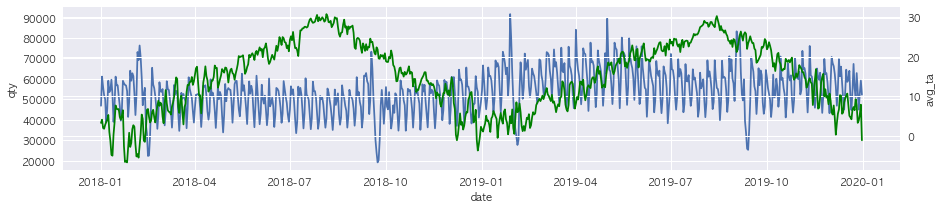

<Figure size 576x396 with 0 Axes>

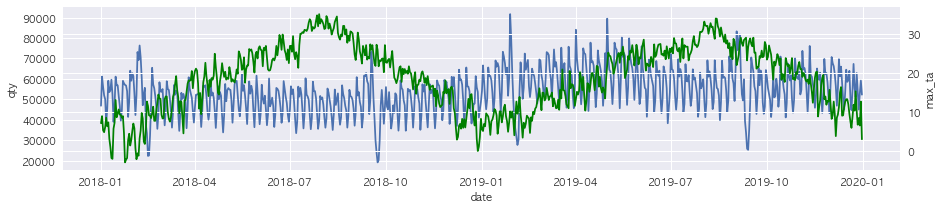

<Figure size 576x396 with 0 Axes>

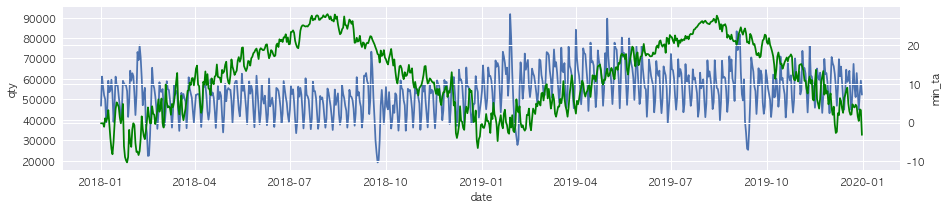

<Figure size 576x396 with 0 Axes>

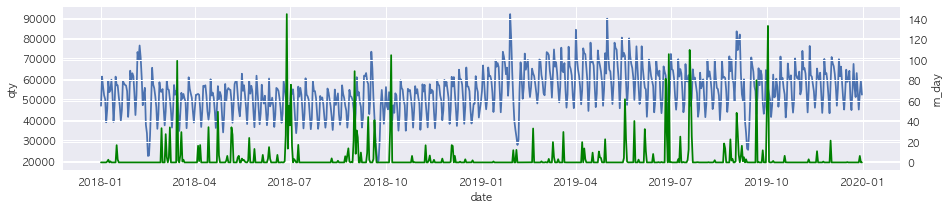

<Figure size 576x396 with 0 Axes>

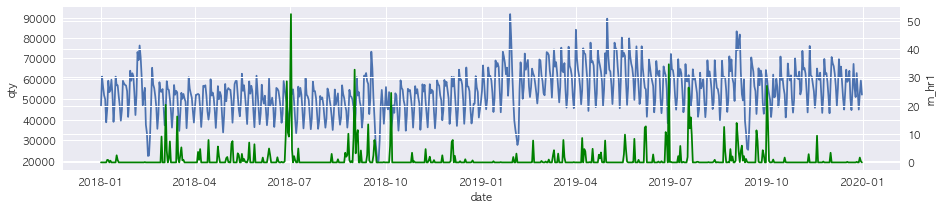

<Figure size 576x396 with 0 Axes>

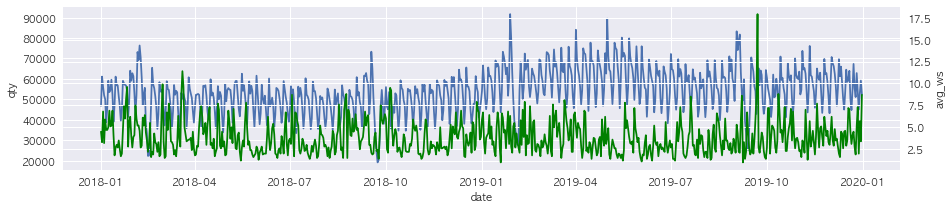

In [106]:
# 168
weather_qty_graph(168)

<Figure size 576x396 with 0 Axes>

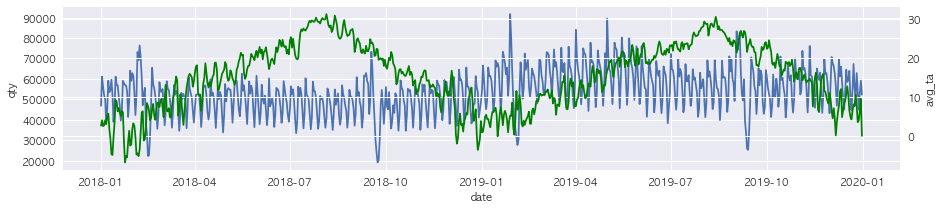

<Figure size 576x396 with 0 Axes>

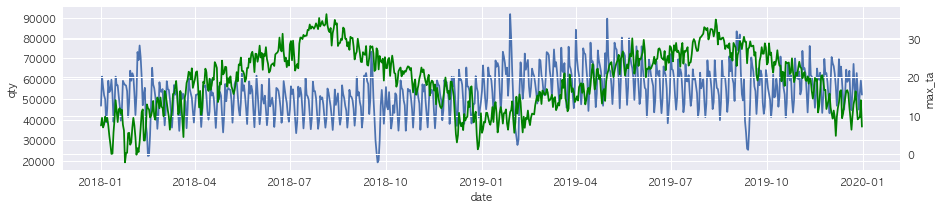

<Figure size 576x396 with 0 Axes>

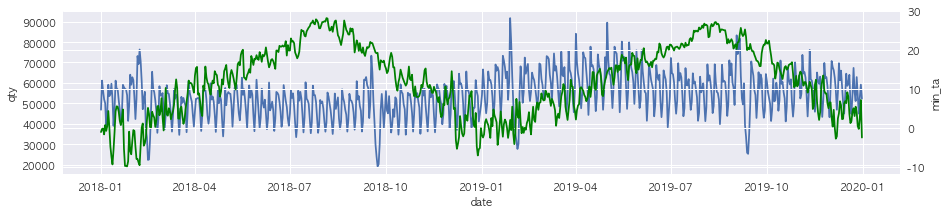

<Figure size 576x396 with 0 Axes>

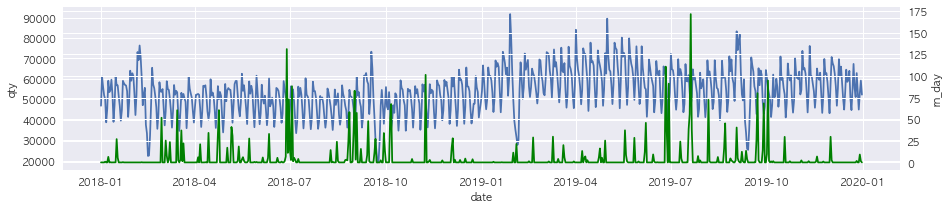

<Figure size 576x396 with 0 Axes>

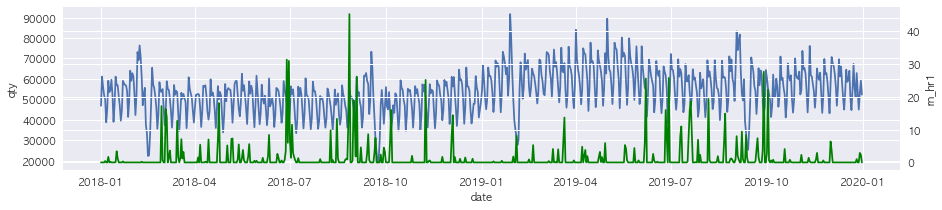

<Figure size 576x396 with 0 Axes>

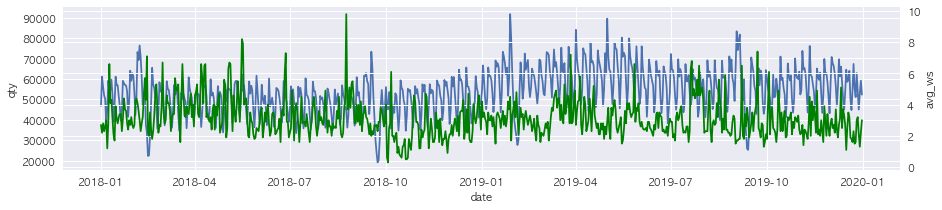

In [108]:
# 159
weather_qty_graph(159)

<Figure size 576x396 with 0 Axes>

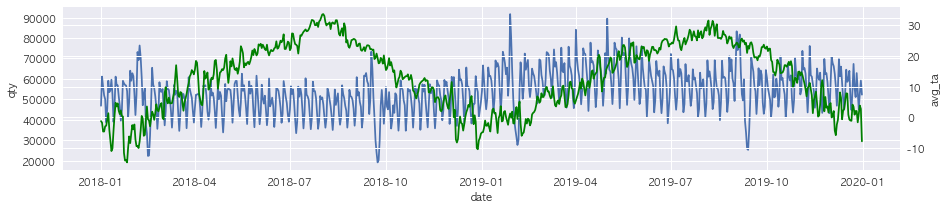

<Figure size 576x396 with 0 Axes>

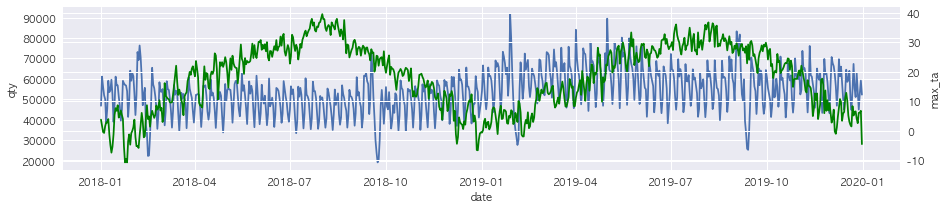

<Figure size 576x396 with 0 Axes>

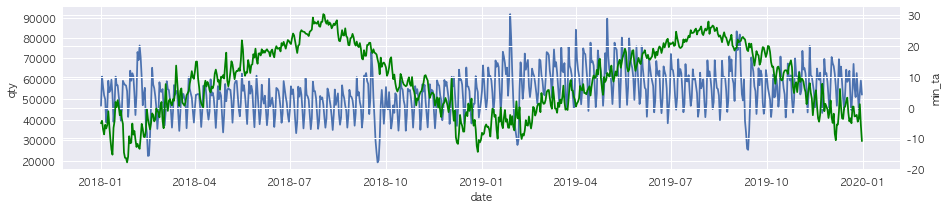

<Figure size 576x396 with 0 Axes>

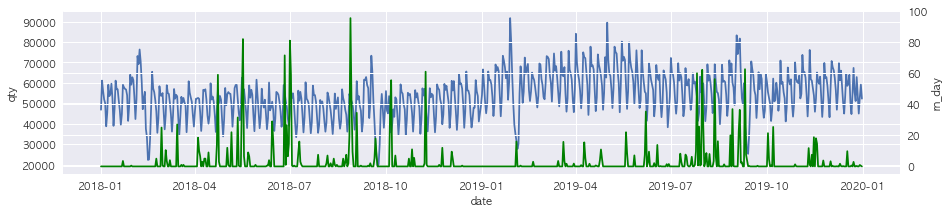

<Figure size 576x396 with 0 Axes>

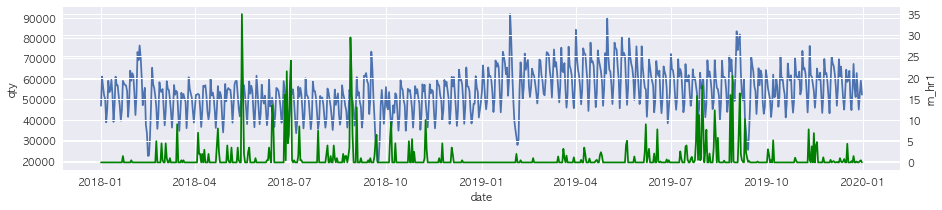

<Figure size 576x396 with 0 Axes>

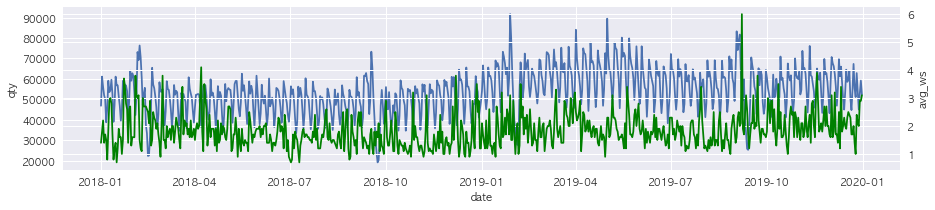

In [109]:
# 108
weather_qty_graph(108)

<Figure size 576x396 with 0 Axes>

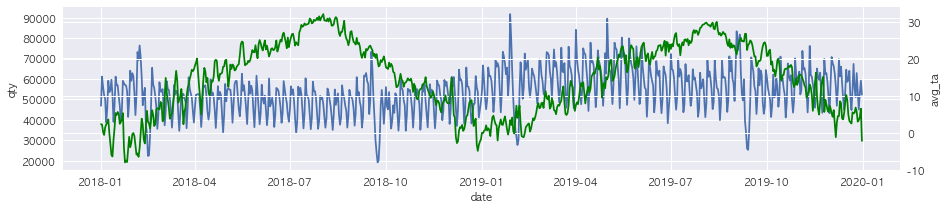

<Figure size 576x396 with 0 Axes>

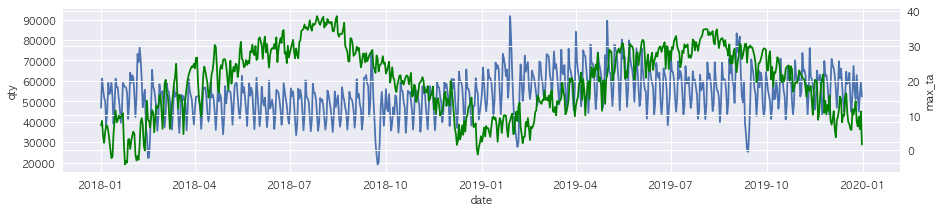

<Figure size 576x396 with 0 Axes>

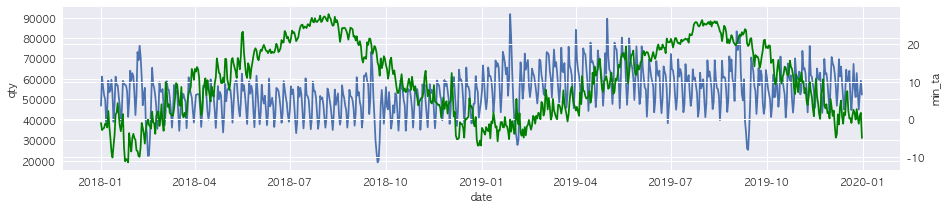

<Figure size 576x396 with 0 Axes>

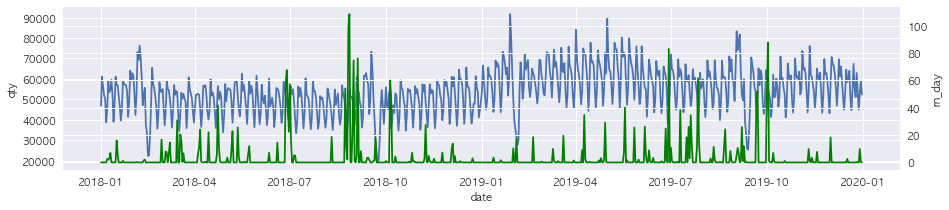

<Figure size 576x396 with 0 Axes>

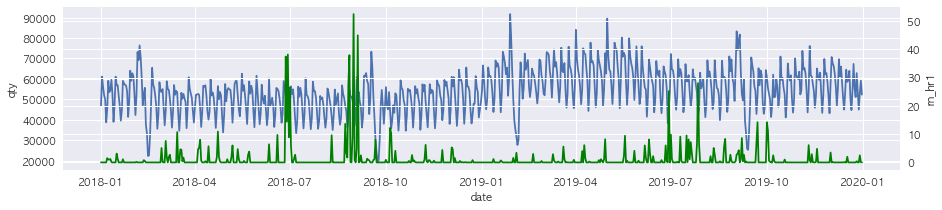

<Figure size 576x396 with 0 Axes>

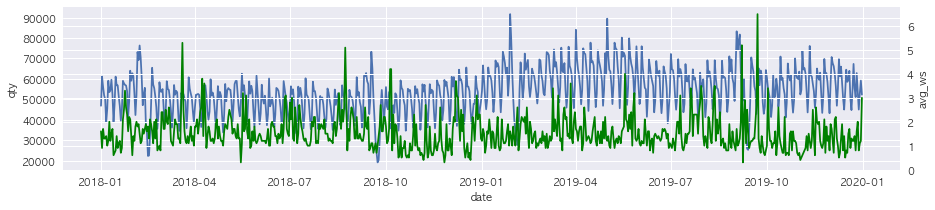

In [111]:
# 156
weather_qty_graph(156)

<Figure size 576x396 with 0 Axes>

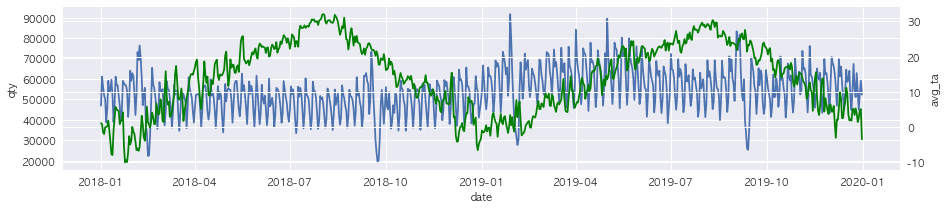

<Figure size 576x396 with 0 Axes>

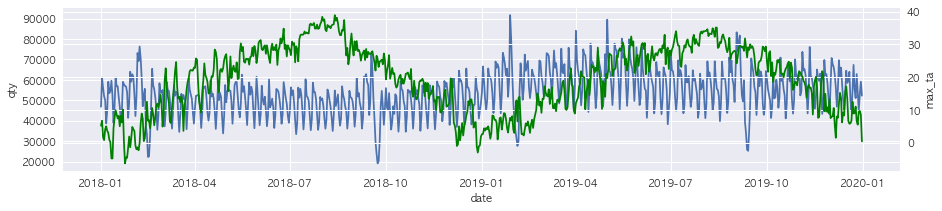

<Figure size 576x396 with 0 Axes>

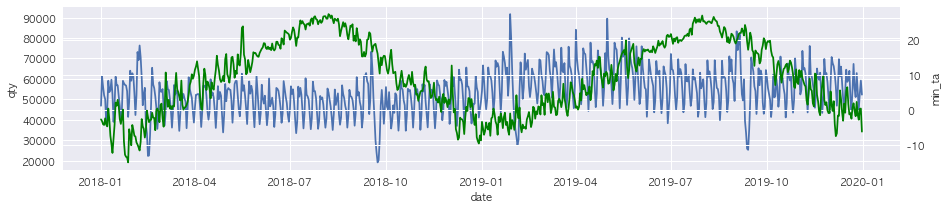

<Figure size 576x396 with 0 Axes>

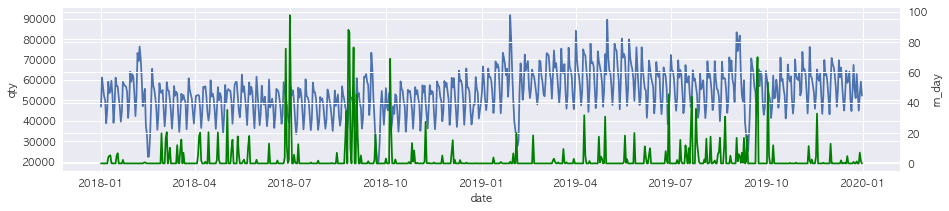

<Figure size 576x396 with 0 Axes>

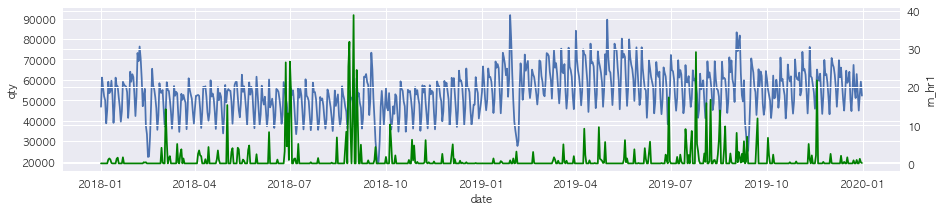

<Figure size 576x396 with 0 Axes>

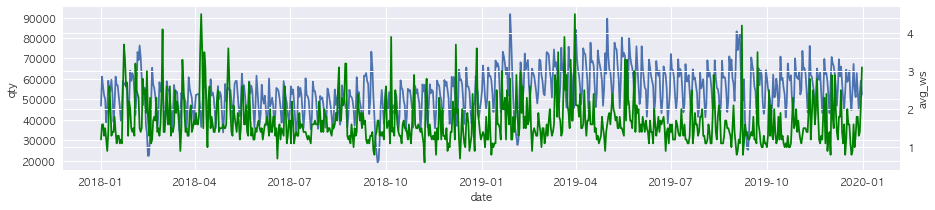

In [112]:
# 146
weather_qty_graph(146)

<Figure size 576x396 with 0 Axes>

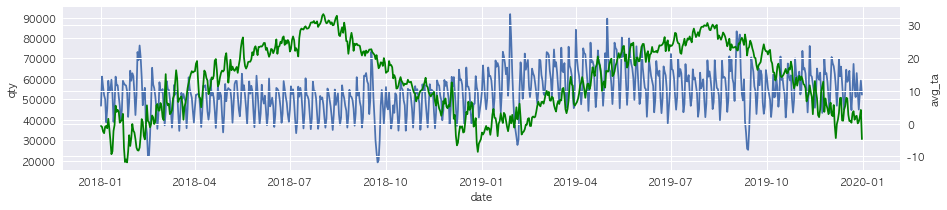

<Figure size 576x396 with 0 Axes>

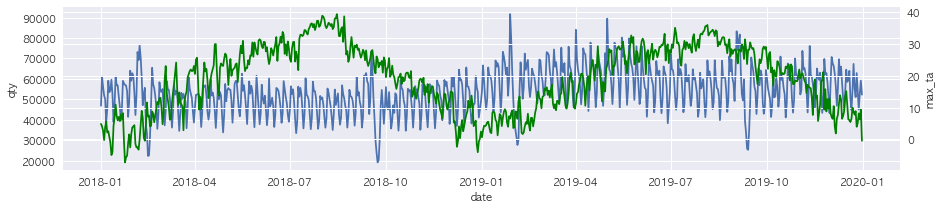

<Figure size 576x396 with 0 Axes>

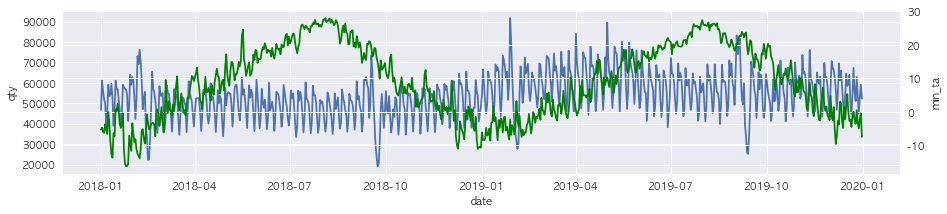

<Figure size 576x396 with 0 Axes>

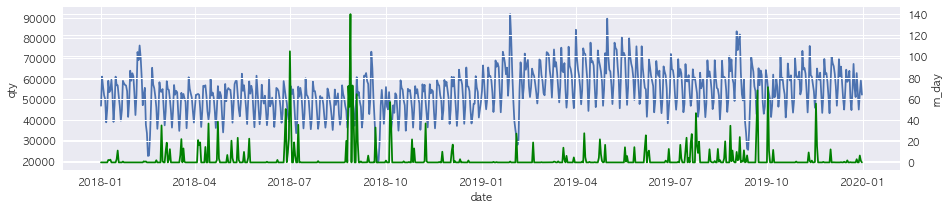

<Figure size 576x396 with 0 Axes>

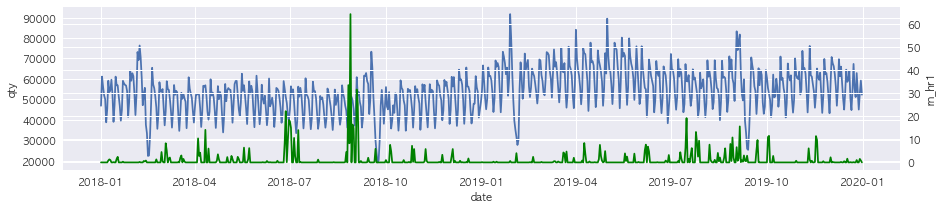

<Figure size 576x396 with 0 Axes>

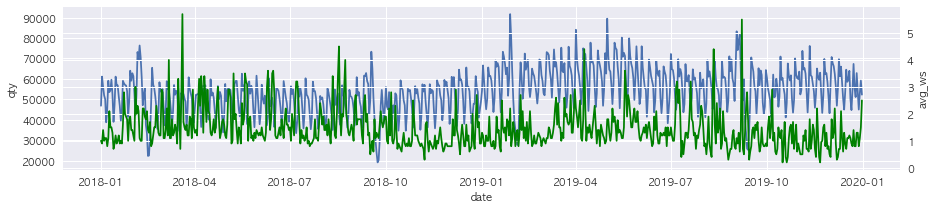

In [113]:
# 133
weather_qty_graph(133)